In [1]:
import numpy as np
import matplotlib.pyplot as plt
import imageio
import os
from PIL import Image

from conex import SqueezeTransform, Intensity2Latency, Conv2dFilter
from conex.helpers.filters import DoGFilter
from torchvision.transforms import transforms

from src.decoders import Latency2Intensity
from src.plots.encoders import add_encoder_raster_plot
from src.transforms import MinMaxNormalizer

In [2]:
img = Image.open('./sample.tif')  # Convert to grayscale
image_array = np.array(img).flatten()
num_unique_values = np.unique(image_array).shape[0]

In [3]:
# Create DoG kernels
dog_kernel = DoGFilter(15, 1, 2, zero_mean=True, one_sum=True).unsqueeze(0).unsqueeze(0)
# Create DoG Filters
dog_filter = Conv2dFilter(dog_kernel, padding='same')

In [16]:
INSTANCE_DURATION = 100
HEIGHT, WIDTH = 512, 512

In [17]:
transformation = transforms.Compose(
    [
        transforms.Grayscale(num_output_channels=1),
        transforms.ToTensor(),
        # dog_filter,
        # MinMaxNormalizer(),
        transforms.Resize((HEIGHT, WIDTH)),
        SqueezeTransform(dim=0),
        Intensity2Latency(time_window=INSTANCE_DURATION),
    ]
)
encoded_ttfs = transformation(img)

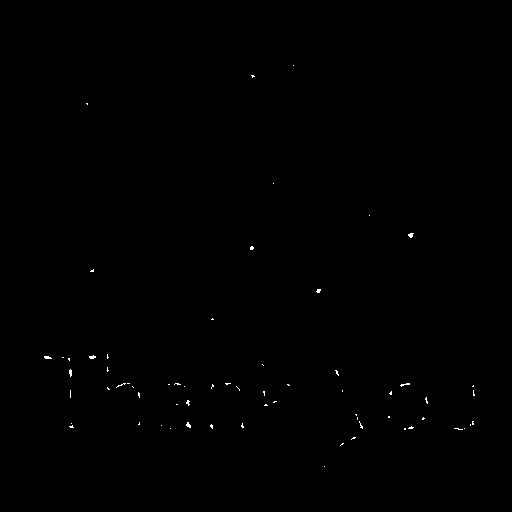

In [18]:
# Create a figure for plotting
# fig = plt.figure()

# List to store image arrays
images = []

for i in range(INSTANCE_DURATION):
    images.append(encoded_ttfs[i])
# Create a GIF
imageio.mimsave('output-2.gif', images, duration=0.8)  # duration controls the time between frames in seconds

# Optionally display the GIF in the notebook if you're using one
from IPython.display import Image
Image(filename='output-2.gif')


In [19]:
def lighten_blend(bg_img, fg_img):
    """Blends two images using the 'lighten' blending mode."""
    return np.maximum(bg_img, fg_img)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


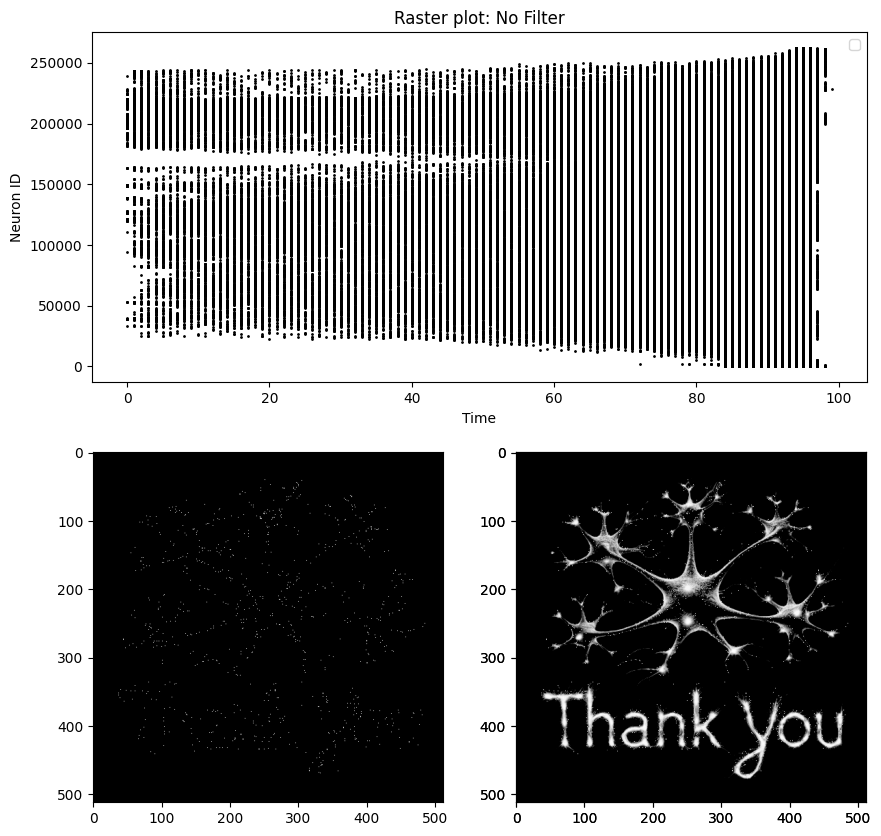

In [20]:
ttfs_decoder = Latency2Intensity(time_window=INSTANCE_DURATION)
fig = plt.figure(figsize=(10, 10))

ax1 = fig.add_subplot(2, 1, 1)
ax1.set_title('Raster plot: No Filter')
add_encoder_raster_plot(encoded_ttfs, ax1, s=1, color='black')

ax2 = fig.add_subplot(2, 2, 3)
ax2.imshow(encoded_ttfs[INSTANCE_DURATION//2], cmap='gray')

ax3 = fig.add_subplot(2, 2, 4)
current_spikes = encoded_ttfs.sum(axis=0)
ttfs_decoder = Latency2Intensity(time_window=INSTANCE_DURATION/2)

ax3.imshow(ttfs_decoder(encoded_ttfs[0:INSTANCE_DURATION//2]), cmap='gray')


blended_img_np = lighten_blend(ttfs_decoder(encoded_ttfs[0:INSTANCE_DURATION//2]), encoded_ttfs[INSTANCE_DURATION//2])
ax2 = fig.add_subplot(2, 2, 4)
ax2.imshow(blended_img_np, cmap='gray')


In [21]:
# encoded_ttfs = encoded_ttfs.reshape(256, -1)

In [22]:
x, y = np.where(encoded_ttfs.reshape(encoded_ttfs.shape[0], -1) == True)
x -= INSTANCE_DURATION
# Create frames
filenames = []
for i in range(INSTANCE_DURATION):
    fig = plt.figure(figsize=(10, 10))
    ax1 = fig.add_subplot(2, 1, 1)
    ax1.scatter(x + i, y, c='black', s=1, marker='o', alpha=0.6)
    ax1.axvline(x=0, color = 'r', linestyle = 'dashed', label = "current")
    ax1.set_xlim([-0.5*INSTANCE_DURATION, +0.5*INSTANCE_DURATION])
    ax1.set_ylim([0, HEIGHT*WIDTH])
    ax1.legend(loc='upper right')
    ax1.grid(False)
    
    ax1.set_title("spike trains")
    
    ax2 = fig.add_subplot(2, 2, 3)
    ax2.imshow(encoded_ttfs[i], cmap='gray')
    ax2.set_title(f"spikes in {i}th iteration")
    
    ax3 = fig.add_subplot(2, 2, 4)
    ttfs_decoder = Latency2Intensity(time_window=i+1)
    ax3.imshow(ttfs_decoder(encoded_ttfs[0:i+1]), cmap='gray')
    # ax3.set_title("Reconstructed image till now")
    # 
    blended_img_np = lighten_blend(ttfs_decoder(encoded_ttfs[0:i+1]), encoded_ttfs[i])
    ax4 = fig.add_subplot(2, 2, 4)
    ax4.imshow(blended_img_np, cmap='gray')
    ax4.set_title("Reconstructed image till now")
    
    filename = f'./frames/frame_{i}.png'
    plt.savefig(filename)
    plt.close()
    filenames.append(filename)

In [23]:
# Create GIF
with imageio.get_writer('output.gif', mode='I', duration=0.1) as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)

# # Remove files
for filename in filenames:
    os.remove(filename)


/tmp/ipykernel_4952/79173150.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)


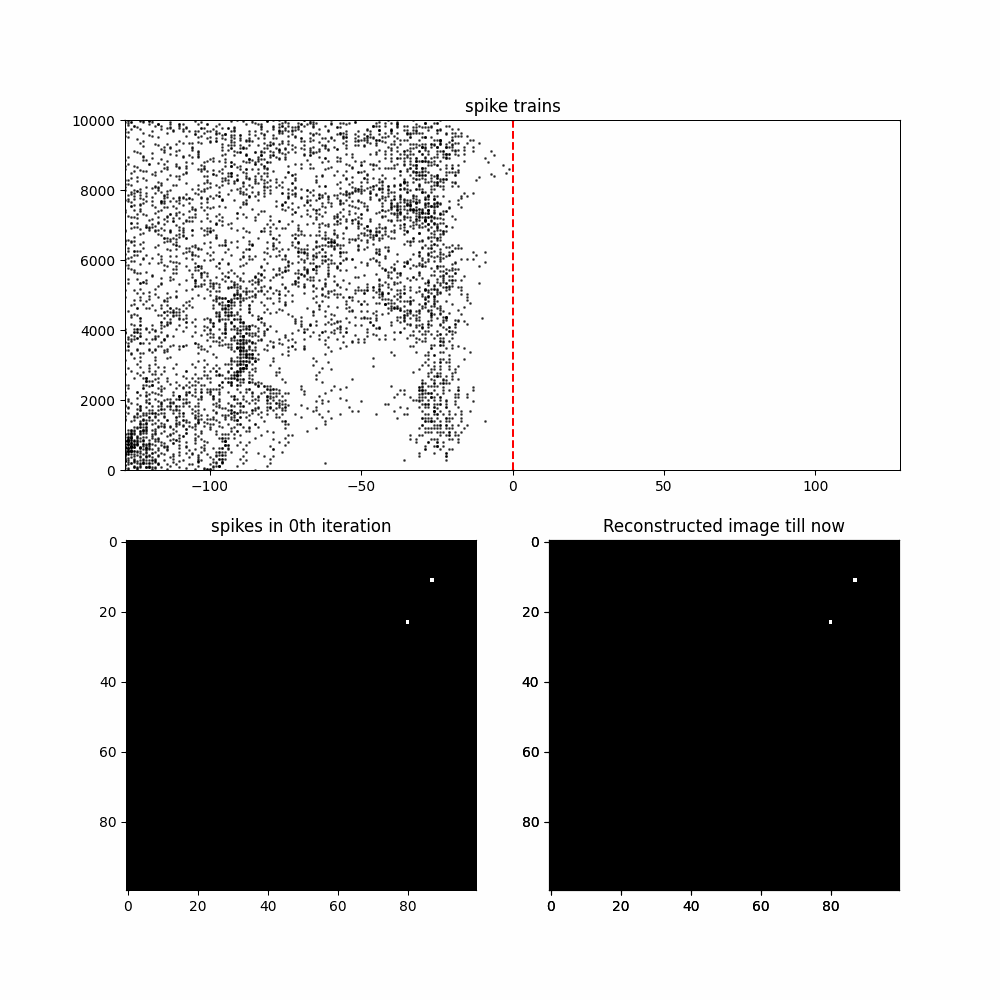

In [2]:
from IPython.display import Image

# Path to your GIF file
gif_path = "./output.gif"

# Display the GIF
Image(filename=gif_path)